In [3]:
from transformers import Sam3Processor, Sam3Model
import torch
from PIL import Image
import numpy as np
from pathlib import Path

# Env loading
from dotenv import load_dotenv
import os

load_dotenv()
hf_token = os.getenv("HF_TOKEN")
os.environ["HF_HOME"] = "./models_cache/SAM_original/"

import sys

sys.path.append("..")
from animgen.core.generated_asset_class import GeneratedAssetClass

from IPython.display import display

In [4]:
VIEW = 13
MESH_PATH = Path("../generated_data/models/img_mesh_Goldfish.glb")
MODEL_PATH = "facebook/sam3"
DEVICE = "cuda" if torch.cuda.is_available() else "cpu"

In [5]:
# Generating View
mesh = GeneratedAssetClass(MESH_PATH)

view_outputs = mesh.views_output

Rendering Multiviews...: 100%|██████████| 20/20 [00:05<00:00,  4.00it/s]


In [6]:
images = view_outputs["matte"]

In [7]:
# MODEL SETUP
model = Sam3Model.from_pretrained(MODEL_PATH).to(DEVICE)
processor = Sam3Processor.from_pretrained(MODEL_PATH)

Loading weights: 100%|██████████| 1468/1468 [00:00<00:00, 13239.27it/s]


In [26]:
prompts = [
    "dorsal fin",
]

text_inputs = processor(text=prompts, return_tensors="pt").to(model.device)

with torch.no_grad():
    text_embeds = model.get_text_features(**text_inputs)

attention_mask = text_inputs.attention_mask

In [27]:
results = []
for i, image in enumerate(images):
    print(f"Processing image {i + 1}/{len(images)}")
    image_inputs = processor(images=image, return_tensors="pt").to(model.device)

    with torch.no_grad():
        vision_embeds = model.get_vision_features(
            pixel_values=image_inputs.pixel_values
        )

        outputs = model(
            vision_embeds=vision_embeds,
            text_embeds=text_embeds,
            attention_mask=text_inputs.attention_mask,
        )
        result = processor.post_process_instance_segmentation(
            outputs,
            threshold=0.5,
            mask_threshold=0.5,
            target_sizes=image_inputs["original_sizes"].tolist(),
        )[0]
        result["images"] = image

    results.append(result)

    del vision_embeds
    del outputs
    del image_inputs
    del image

Processing image 1/20
Processing image 2/20
Processing image 3/20
Processing image 4/20
Processing image 5/20
Processing image 6/20
Processing image 7/20
Processing image 8/20
Processing image 9/20
Processing image 10/20
Processing image 11/20
Processing image 12/20
Processing image 13/20
Processing image 14/20
Processing image 15/20
Processing image 16/20
Processing image 17/20
Processing image 18/20
Processing image 19/20
Processing image 20/20


In [29]:
results[0].keys()

dict_keys(['scores', 'boxes', 'masks', 'images'])

Mask 0, score 0.8295


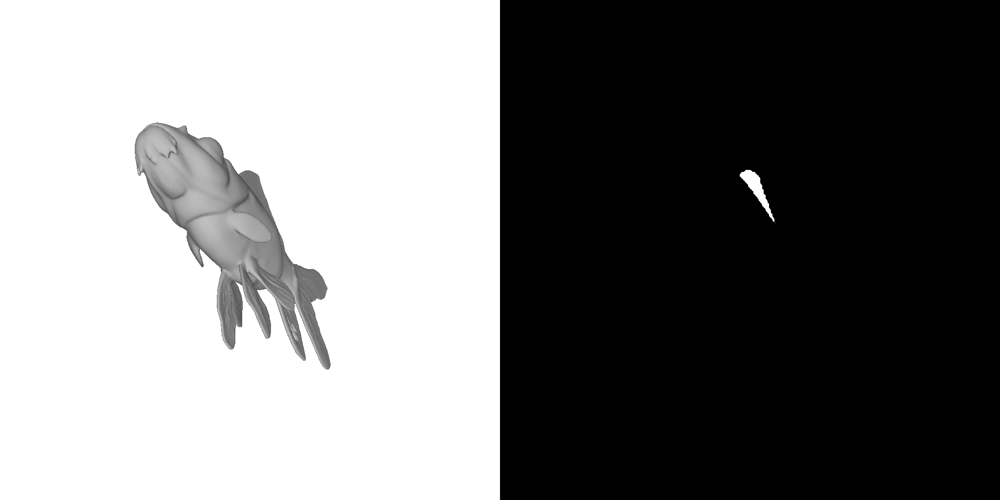

Mask 1, score 0.9297


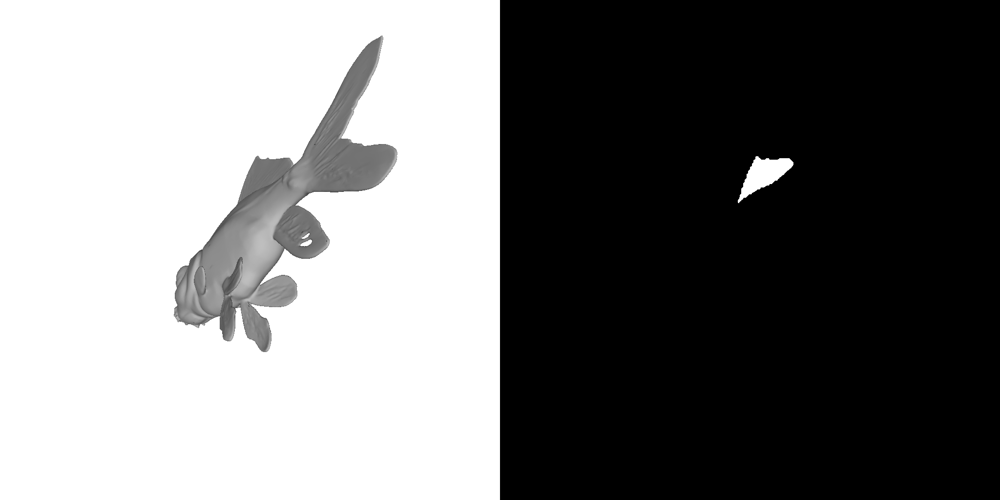

Mask 2, score 0.9496


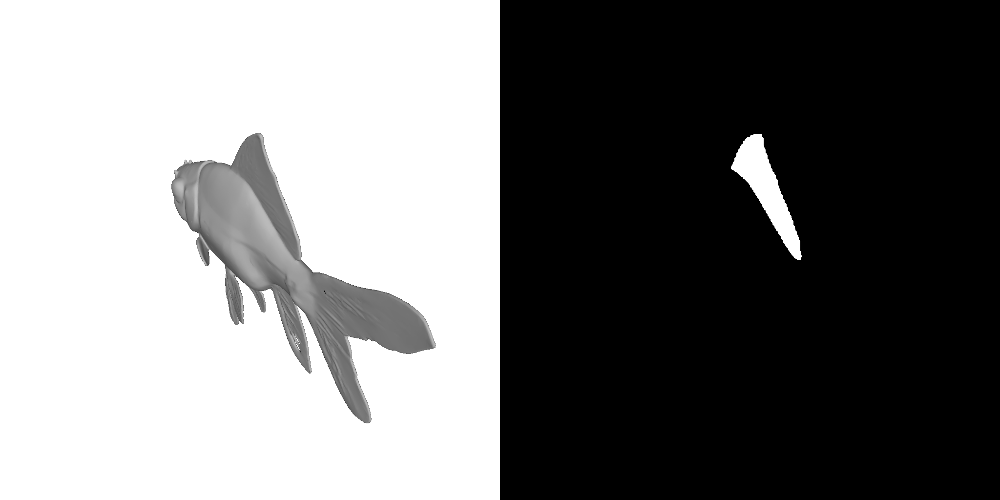

Mask 3, score 0.9527


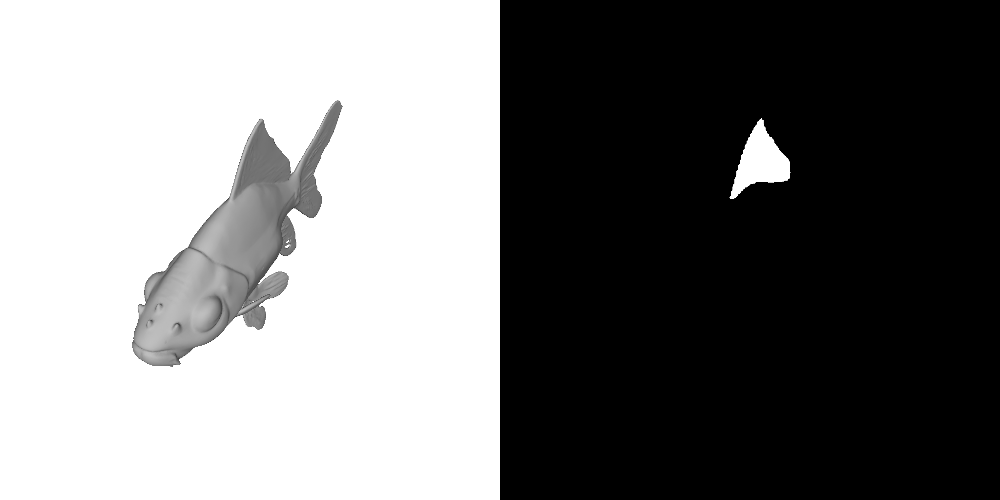

Mask 4, score 0.7959


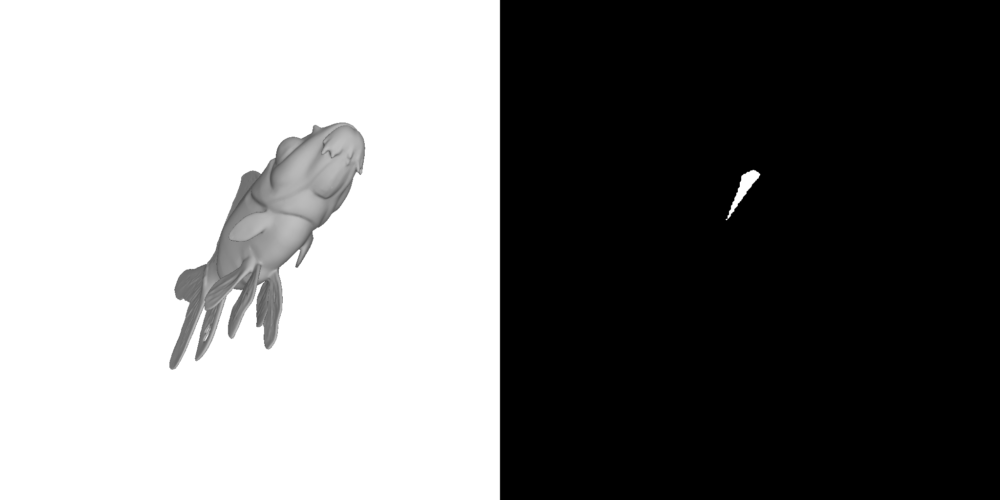

Mask 5, score 0.9400


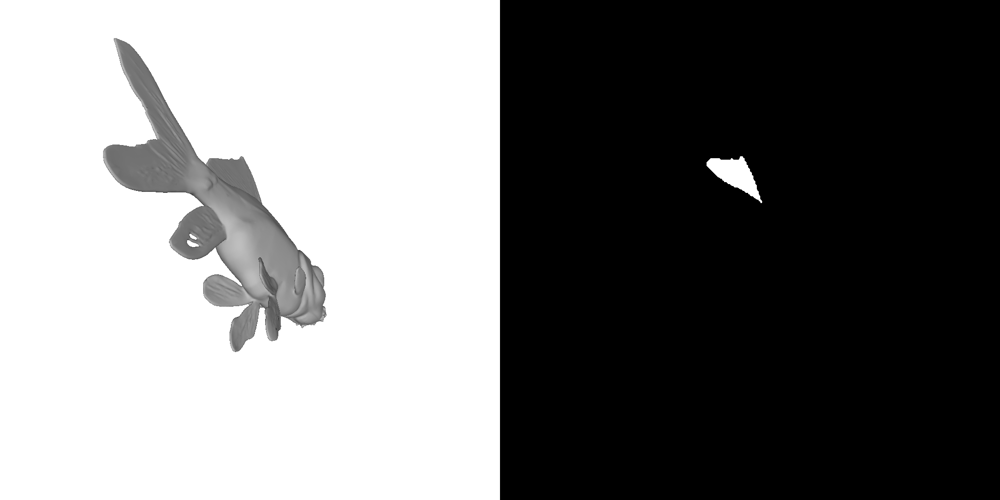

Mask 6, score 0.9567


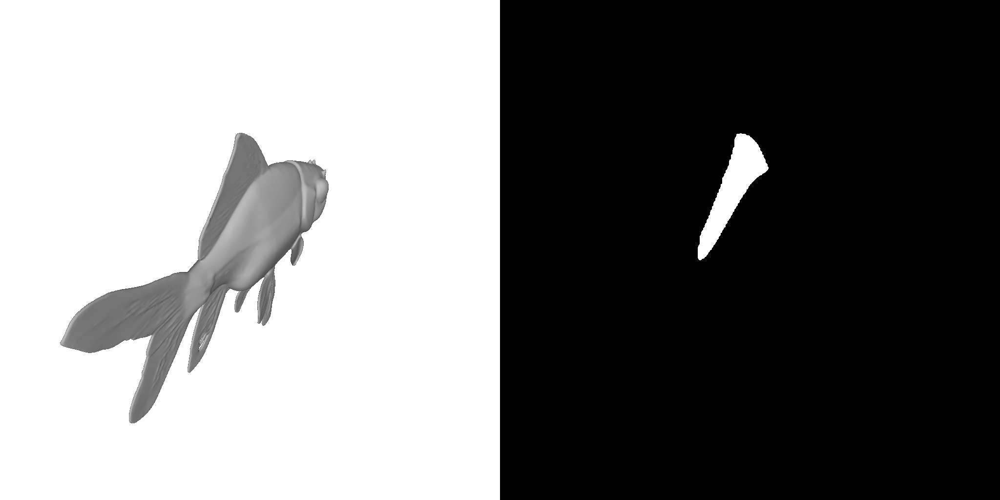

Mask 7, score 0.9474


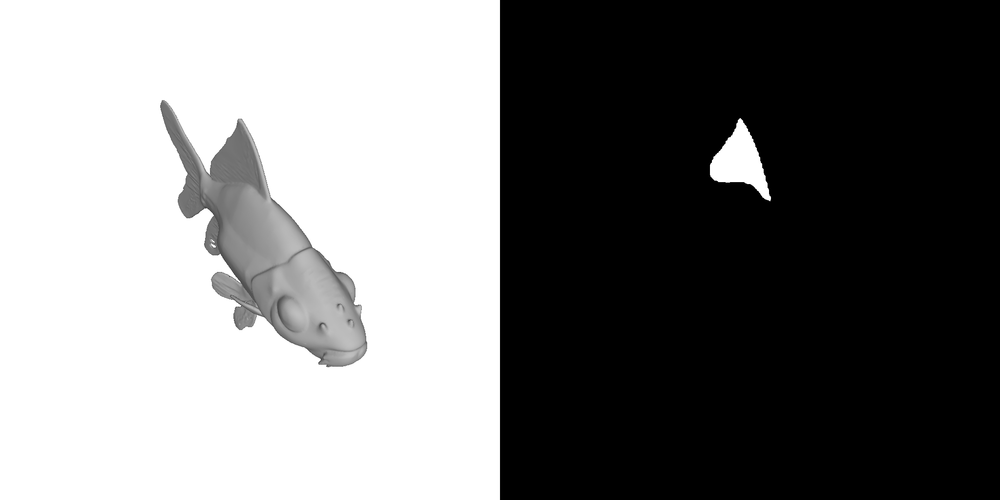

Mask 8, score 0.9429


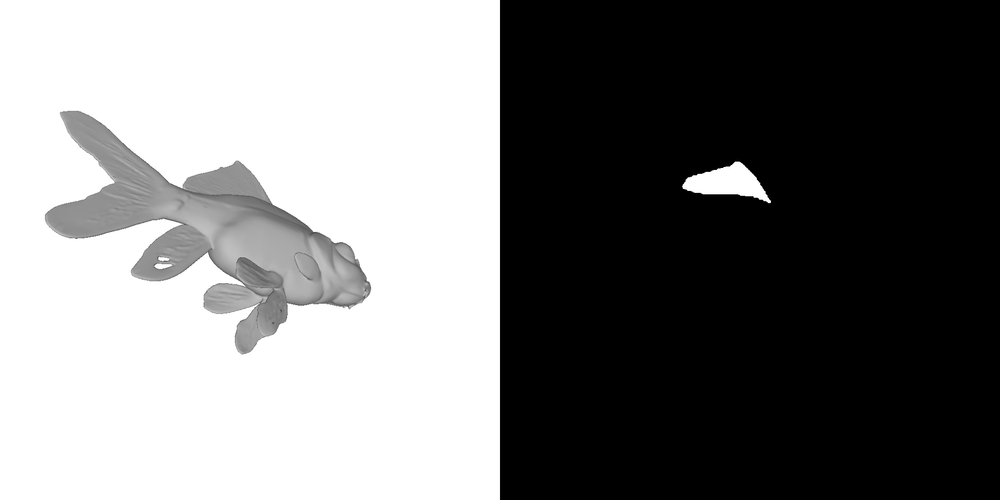

Mask 9, score 0.9673


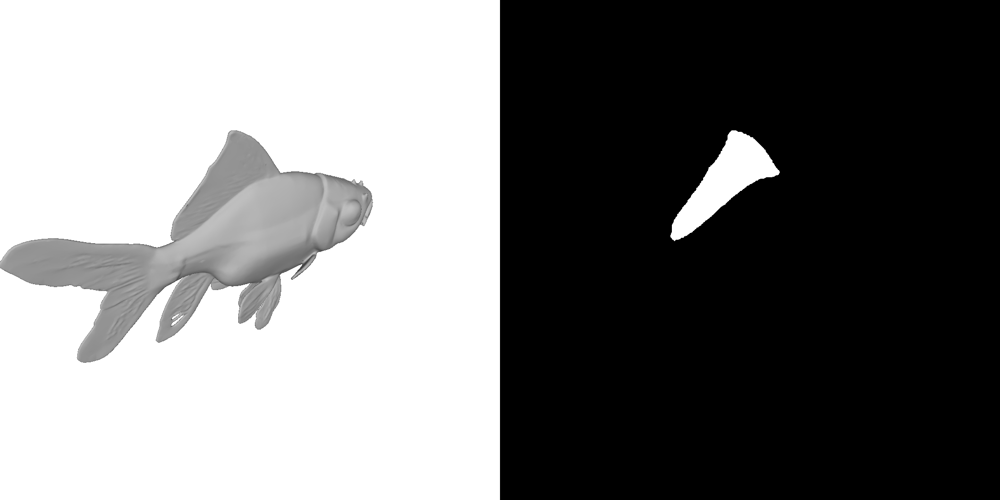

Mask 10, score 0.9646


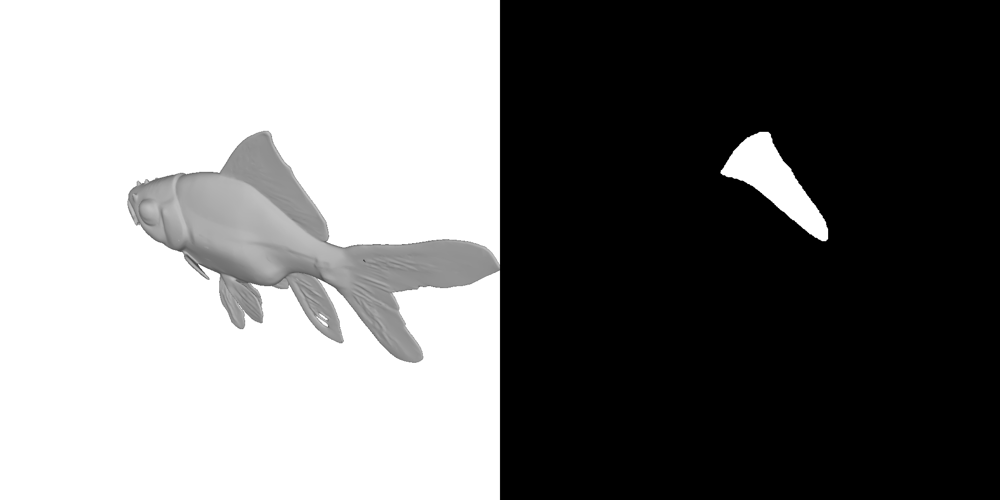

Mask 11, score 0.9413


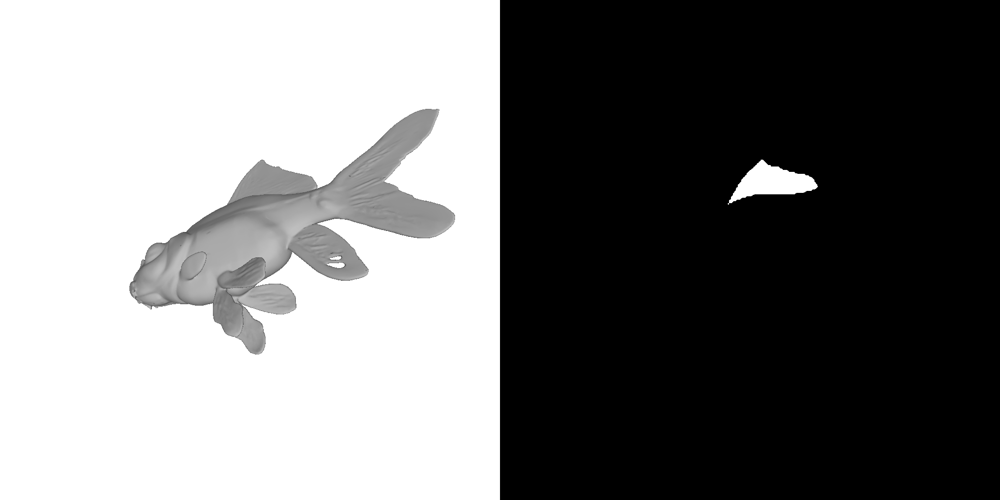

Mask 12, score 0.9494


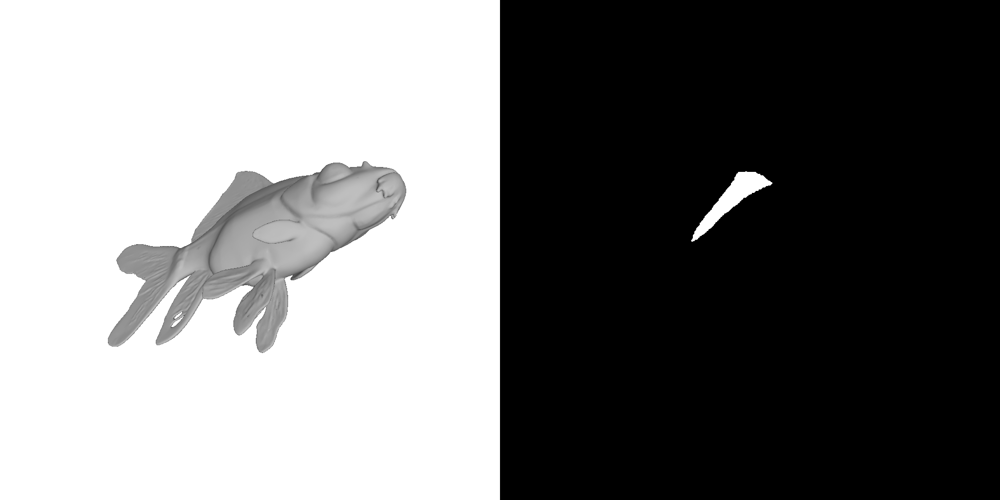

Mask 13, score 0.9599


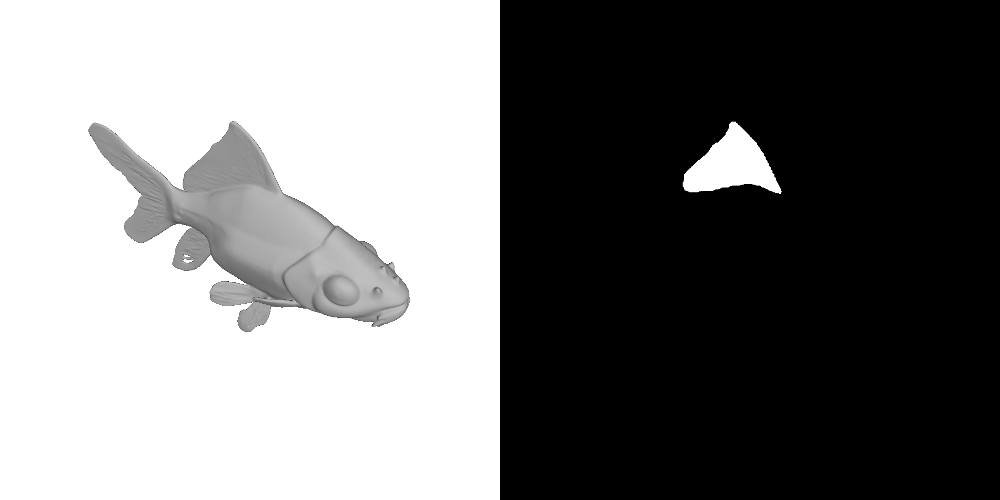

Mask 14, score 0.9600


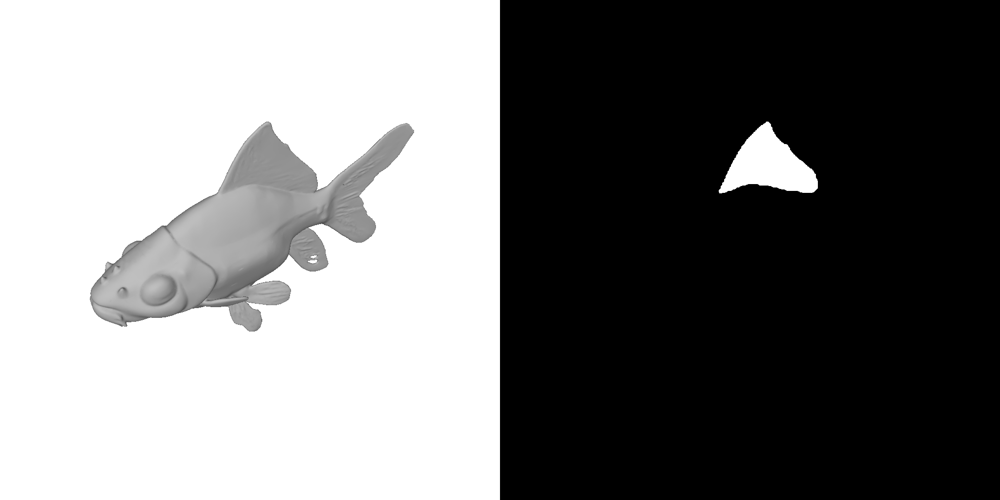

Mask 15, score 0.9556


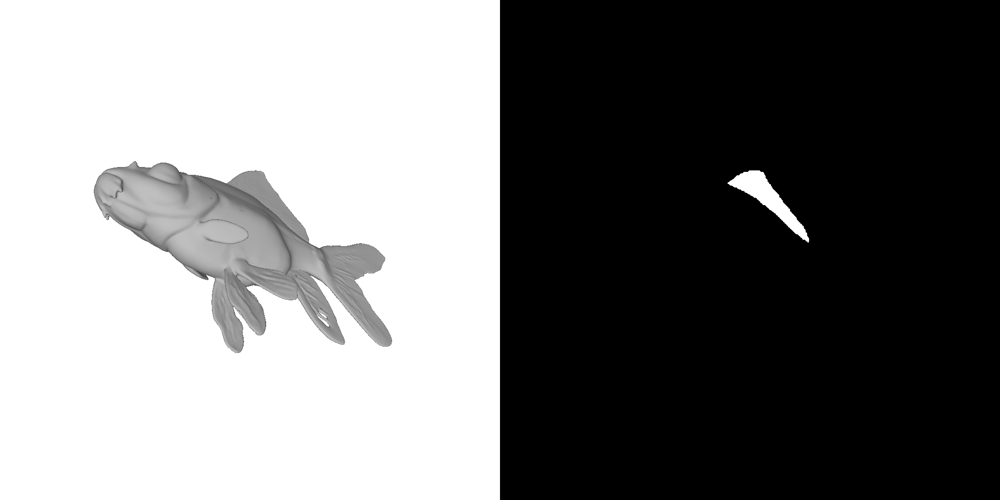

Mask 16, score 0.9553


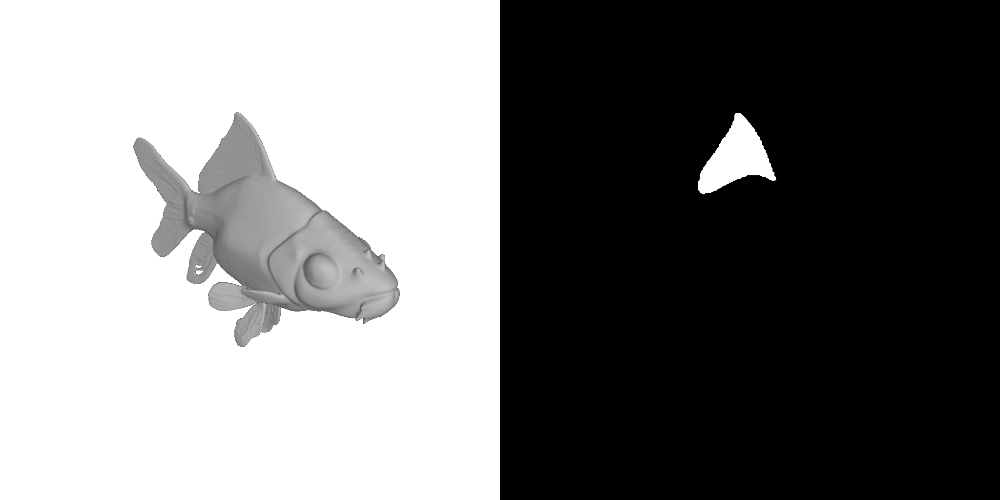

Mask 17, score 0.9606


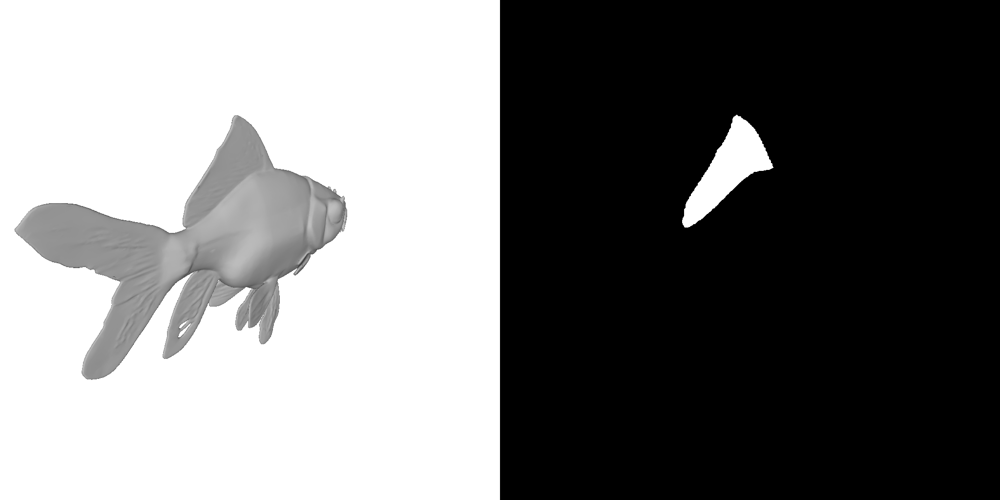

Mask 18, score 0.9602


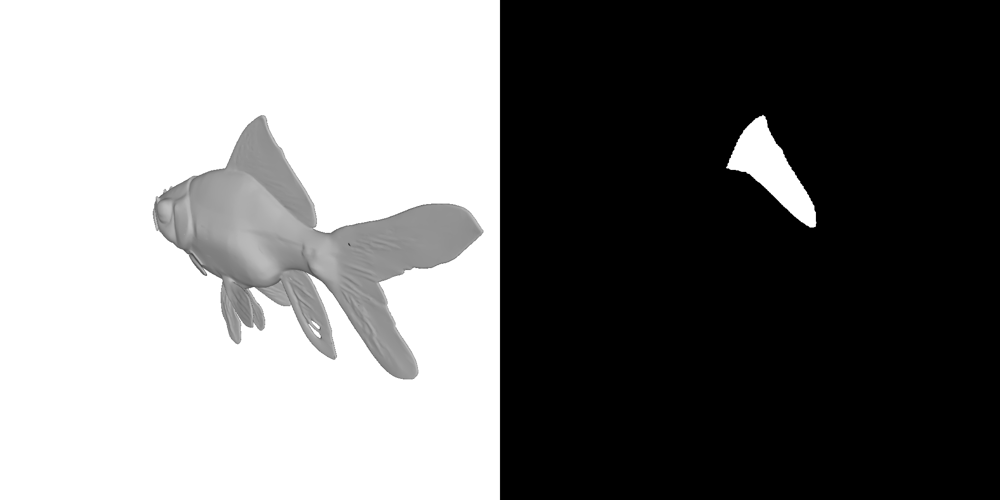

Mask 19, score 0.9633


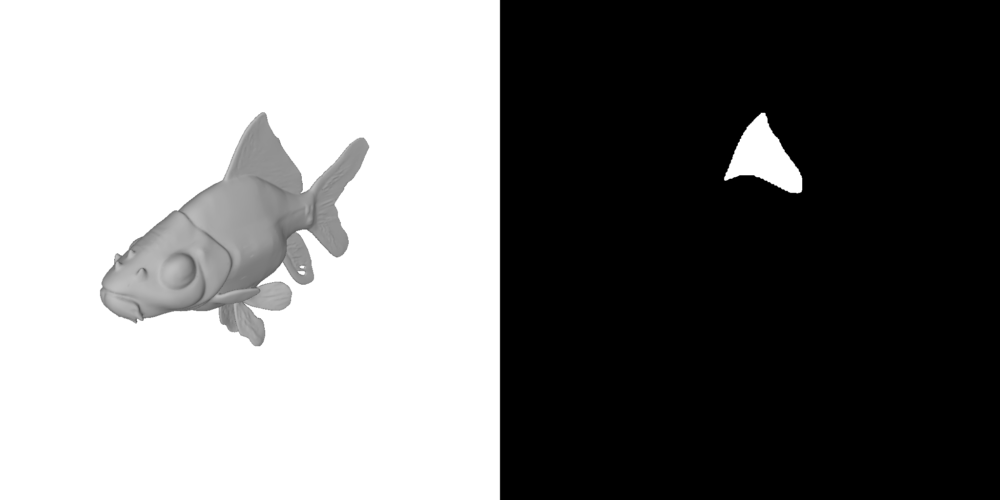

In [30]:
for i, result in enumerate(results):
    mask = result["masks"].cpu().numpy()[0]
    mask = Image.fromarray((mask * 255).astype(np.uint8)).convert("RGB")

    score = result["scores"].cpu().numpy()
    image = result["images"]

    combined = Image.new("RGB", (image.width + mask.width, image.height))
    combined.paste(image, (0, 0))
    combined.paste(mask, (image.width, 0))

    print(f"Mask {i}, score {score[0]:.4f}")
    display(combined)

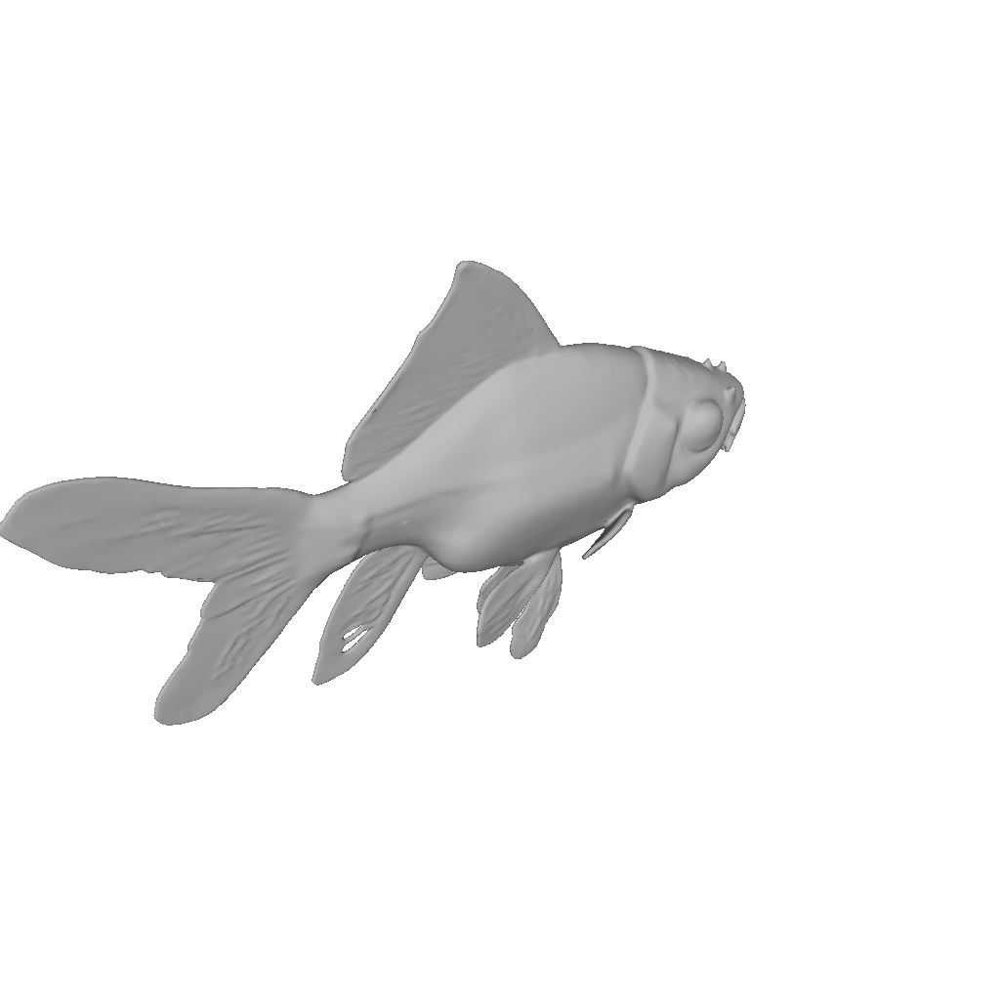

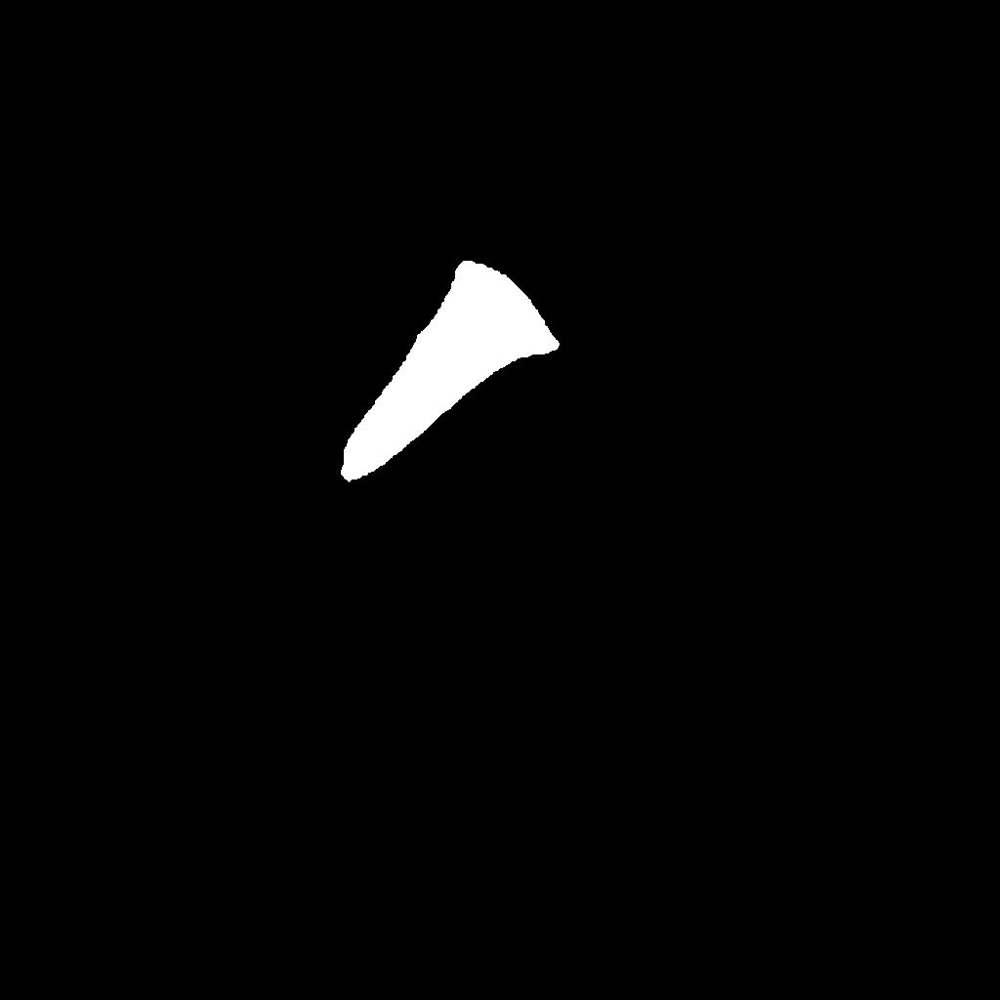

In [42]:
chosen_int = 9
chosen_result = results[chosen_int]

chosen_mask = mask = chosen_result["masks"].cpu().numpy()[0]
chosen_mask_image = Image.fromarray((chosen_mask * 255).astype(np.uint8)).convert("RGB")

chosen_faces = view_outputs["faces"][chosen_int]

display(chosen_result["images"])
display(chosen_mask_image)

In [43]:
import numpy as np

masked_pixels = chosen_mask > 0
masked_face_ids = chosen_faces[masked_pixels]

masked_face_ids = masked_face_ids[masked_face_ids >= 0]

selected_faces = np.unique(masked_face_ids)

print(f"Recovered {len(selected_faces)} mesh faces")
print(selected_faces[:20])

Recovered 1687 mesh faces
[17911 17912 17914 18161 18164 18165 18168 18386 18389 18390 18394 18629
 18630 18632 18633 18635 18637 18638 18640 18882]


In [44]:
print(chosen_faces.min(), chosen_faces.max())
print(chosen_faces.shape)
print(selected_faces.shape)

-1 49984
(1024, 1024)
(1687,)


In [45]:
import numpy as np

tm_mesh = mesh.mesh
# RGBA colors
face_colors = np.tile(
    np.array([180, 180, 180, 255], dtype=np.uint8), (len(tm_mesh.faces), 1)
)

face_colors[selected_faces] = np.array([255, 0, 0, 255], dtype=np.uint8)

tm_mesh.visual.face_colors = face_colors

tm_mesh.show()

In [46]:
all_selected_faces = set()

for i in range(len(results)):
    chosen_result = results[i]

    chosen_mask = chosen_result["masks"].cpu().numpy()[0]
    chosen_faces = view_outputs["faces"][i]

    masked_pixels = chosen_mask > 0

    # Face IDs at those pixels
    masked_face_ids = chosen_faces[masked_pixels]
    masked_face_ids = masked_face_ids[masked_face_ids >= 0]
    all_selected_faces.update(masked_face_ids.tolist())

selected_faces = np.array(sorted(all_selected_faces), dtype=np.int32)

print(f"Recovered {len(selected_faces)} unique faces.")

Recovered 3991 unique faces.


In [47]:
tm_mesh = mesh.mesh

face_colors = np.tile(
    np.array([180, 180, 180, 255], dtype=np.uint8), (len(tm_mesh.faces), 1)
)

face_colors[selected_faces] = np.array([255, 0, 0, 255], dtype=np.uint8)

tm_mesh.visual.face_colors = face_colors

tm_mesh.show()